# View image in DS9
=====================


- Author : Sylvie Dagoret-Campagne
- Date March 8th 2018


The purpose is to check the center in each images

The purpose is to view series of reduced images

## Nice style for the notebook

In [6]:
from IPython.core.display import HTML
def css_styling():
    styles = open("../../styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

## Notebook Imports

In [7]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
ccdproc version 1.3.0
bottleneck version 1.2.1
/pbs/throng/lsst/users/dagoret/GitHubatCC/CTIOAnaJun2017/ana_30may17/HD111980


In [8]:
import pyds9

In [9]:
import pandas as pd

## Notebook configuration

In [10]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 10),   #defines the default image size
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [11]:
plt.rcParams.update({'figure.max_open_warning': 0})

## Definition of images locations 

In [12]:
inputdir="/sps/lsst/data/AtmosphericCalibration/CTIODataJune2017_reducedRed/data_30may17"
MIN_IMGNUMBER=58
MAX_IMGNUMBER=190
date="20170530"
object_name='HD111980'
tag = "reduc"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

In [16]:
dir_top_images="images_notebooks/"+'ViewReducedImages' ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

# Start viewing images

In [13]:
dirlist_all = [inputdir] # only one directory to process
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)
print 'Number of images:',len(all_images)

Number of images: 133


## View images in the notebook

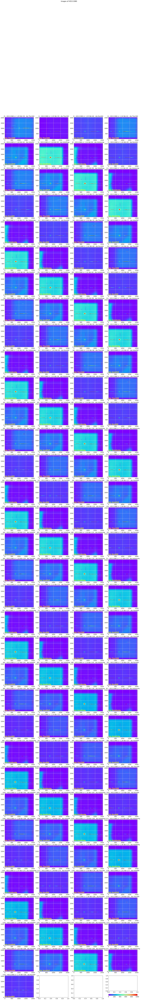

In [17]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=4,vmin=0,vmax=1000,downsampling=1,verbose=False)
figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

## View a single image alone

In [20]:
sel_index=0 # select the image number

Text(1000,1700,u'dia Thor300')

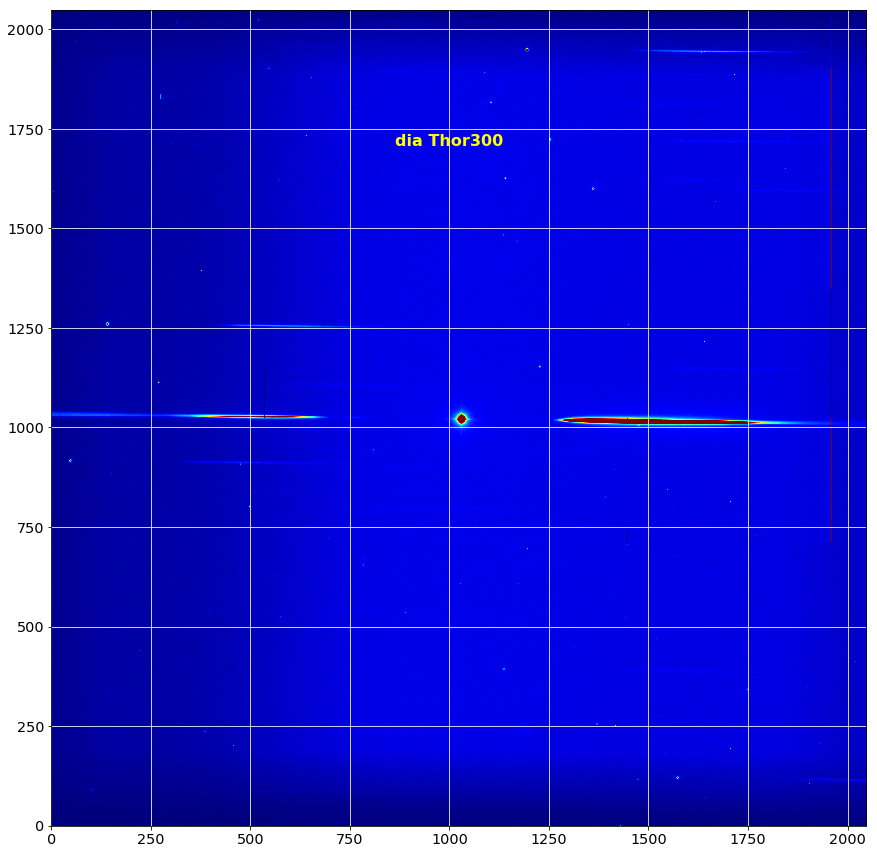

In [25]:
plt.figure(figsize=(15,15))
plt.imshow(all_images[sel_index],origin='lower',cmap='jet',vmin=0, vmax=2000)
plt.grid(color='white', ls='solid')
plt.text(1000.,1700,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

## View the image in DS9

In [26]:
fullfile=os.path.join(sorted_files[sel_index])

In [35]:
print(pyds9.ds9_targets())

None


In [37]:
d = pyds9.DS9()

In [42]:
# define the zoom
ds9command='zoom 1'
d.set(ds9command)
# set the scale
ds9command='scale histequ zscale'
d.set(ds9command)
# set the color
ds9command='cmap rainbow'
d.set(ds9command)
ds9command = 'file '+ fullfile
d.set(ds9command)  # send the file to the open ds9 sessi

1